# Fourier filtering and strain mapping
This example notebook demonstrates Fourier filtering and strain analysis with both phase lock-in local wave fitting on an atomic resolution HAADF STEM image of a partially relaxed thin film with misfit dislocations. 

The phase lock in method is described in detail in [Goodge, B. H., El Baggari, I., Hong, S. S., Wang, Z., Schlom, D. G., Hwang, H. Y., & Kourkoutis, L. F. (2022). Disentangling coexisting structural order through phase lock-in analysis of atomic-resolution STEM data. Microscopy and Microanalysis, 28(2), 404-411.](https://doi.org/10.1017/S1431927622000125)

The local wave fitting method  is described in [Smeaton, M. A., El Baggari, I., Balazs, D. M., Hanrath, T., & Kourkoutis, L. F. (2021). Mapping defect relaxation in quantum dot solids upon in situ heating. ACS nano, 15(1), 719-726.](https://doi.org/10.1021/acsnano.0c06990)


In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
from tifffile import imread
import kemstem
%matplotlib widget
print(f'{kemstem.__version__=}')

kemstem.__version__='0.0.4'


# Data loading and preprocessing
We begin by loading an atomic resolution HAADF STEM image of our film, and performing some basic preprocessing before beginning analysis. Here, the image is cropped to a square for ease of analysis and the intensity is normalized between 0 and 1 for interpretability.

Image shape (2031, 2025)
Cropped to (2025, 2025)
Normalized to min: 0.0, max: 1.0


(-0.5, 2024.5, 2024.5, -0.5)

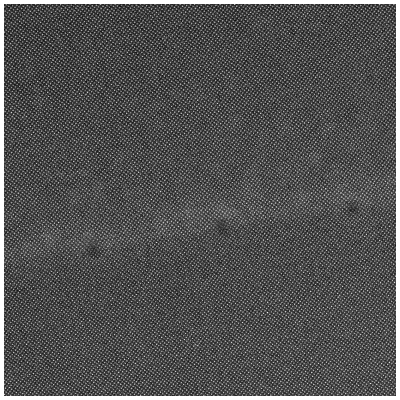

In [2]:
filename = 'data/rI_1341 2.6 Mx B_C270_0_HAADF.tif'

image = imread(filename)
print(f'Image shape {image.shape}')
image = image[:min(image.shape),:min(image.shape)]
print(f'Cropped to {image.shape}')
image = kemstem.util.normalize(image)
print(f'Normalized to min: {image.min()}, max: {image.max()}')

fig,ax = plt.subplots(1,1,constrained_layout=True,figsize=(4,4))
ax.matshow(image,cmap='gray')
ax.axis('off')

The doubling of peaks in the below pattern along both the in-plane and out-of-plane directions indicates that both lattice parameters differ between the film and substrate

(-0.5, 2024.5, 2024.5, -0.5)

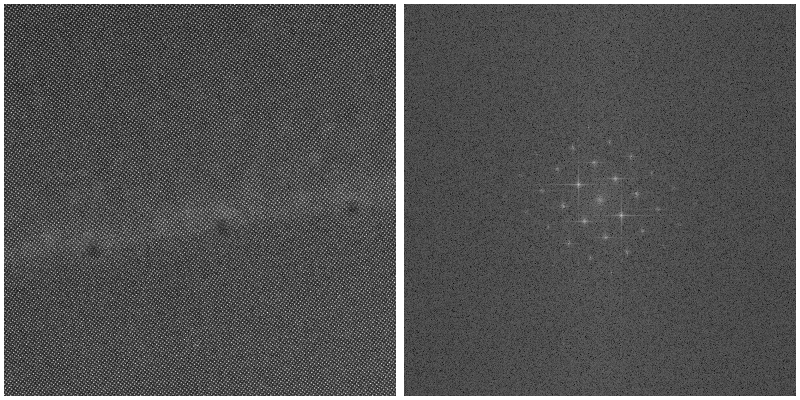

In [3]:
pattern_c = kemstem.prepare_fourier_pattern(image)
pattern_log = kemstem.prepare_fourier_pattern(image,log=True,log_offset=1e0) # Here we also take a log transform of the FFT for ease of visualization

fig,ax = plt.subplots(1,2,constrained_layout=True,figsize=(8,4))
ax[0].matshow(image,cmap='gray')
ax[0].axis('off')
ax[1].matshow(pattern_log,cmap='gray')
ax[1].axis('off')

# Identifying FFT peaks of interest
Here we can select one low order in-plane and one out-of-plane peak in the FFT to analyze the relaxation of the film.

The next cell allows these peaks to be picked manually, or uncomment the following cell to use a preselected set of peak positions.

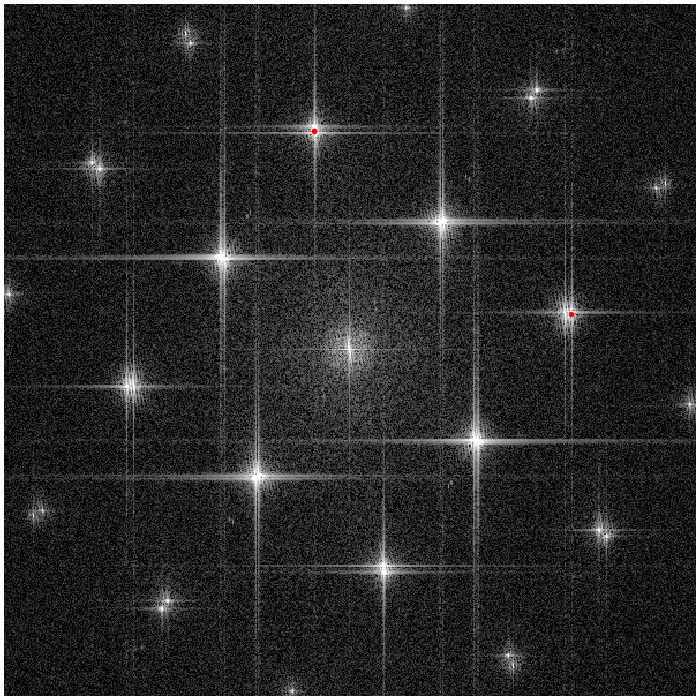

In [10]:
preselected = np.array([[ 981.58470384, 1204.50026034],
                        [ 822.12686051,  981.58470384]])
zoom = 300 # crop the pattern to display only the center area (with radius set by zoom in pixels) with useful information

# to select peaks by hand, change the preselected argument below to None
selected_peaks = kemstem.select_peaks(pattern_log,preselected=preselected,zoom=zoom,select_conjugates=True,figsize=(7,7),delete_within=5,vmin=4,vmax=9,)

# Fitting FFT peaks
Next, we fit the peaks using 2D gaussians. Here only the peak positions are important, so just refining them with e.g. center of mass is also reasonable.

These peak positions are quite important as they will essentially serve as without further adjustment they will serve as the reference parameters for the following phase and strain measurements. It may be interesting to adjust the peak guess positions and/or fit parameters to test the effect of mapping the film peak, the substrate peak, and the position between the two.

Selected X positions: [1204.50026034  981.58470384]
Selected Y positions: [981.58470384 822.12686051]


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 75.87it/s]


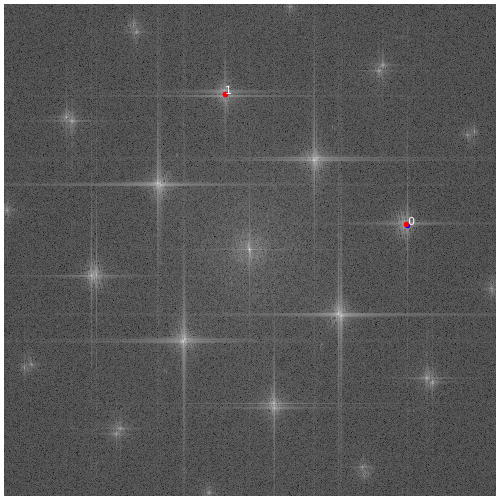

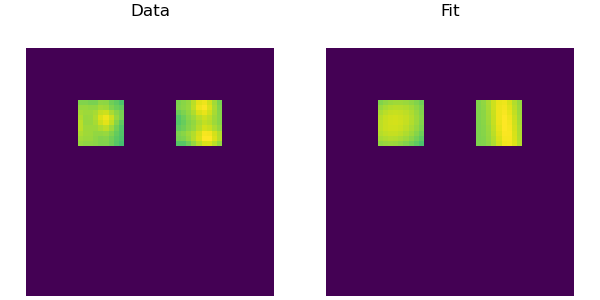

In [13]:
p0 = np.array(selected_peaks).T
print(f'Selected X positions: {p0[:,1]}')
print(f'Selected Y positions: {p0[:,0]}')

peaks_ref,errs,opts,data_fits  = kemstem.refine_peaks_gf(gaussian_filter(pattern_log,1), p0, window_dimension=9, remove_unfit = False)
fig,ax = plt.subplots(1,1,constrained_layout=True,figsize=(5,5))
kemstem.plot_numbered_points(pattern_log,p0,ax=ax,color='b',zoom=zoom)
ax.plot(peaks_ref[:,1],peaks_ref[:,0],'r.')
ax.axis('off')

_ = kemstem.util.plot_fit_comparison(data_fits,)

# Fourier Filtering
One of the peaks picked and refined previously can be selected for filtering with the `peak_index` variable. For filtering, the key parameter in addition to the peak position is the width of the gaussian profile applied around the peak in the FFT to select it - this width will be inversely proportional to the resulting resolution or coarsening length of the fourier filtered signal and its derivatives (the extracted phase and strain maps), but choosing too large of a filter will incorporate harmful noise in the filtered signal. This is set with the `sigma` variable that determines the standard deviation of the gaussian profile in k-space. The real space coarsening length corresponding to this filter size is visualized with the black and white coarsening markers in the bottom right of the images. 

/var/folders/b5/3ghqwkld021fbr9f1r7n38900000gn/T/ipykernel_83878/3004139374.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax = plt.subplots(1,3,constrained_layout=True,figsize=(12,4))


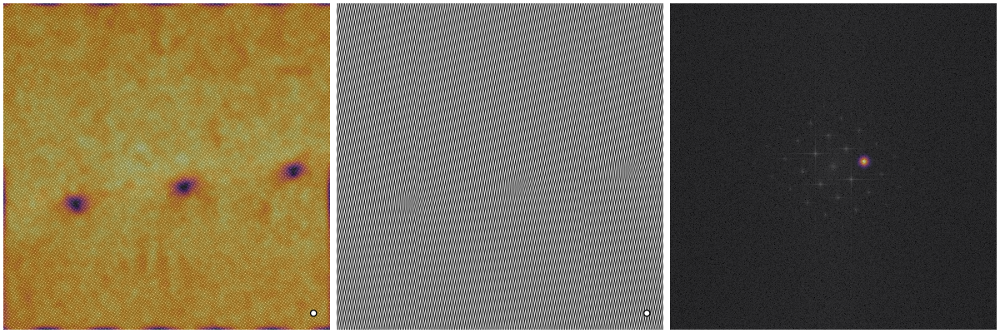

In [21]:
peak_index = 0
sigma= 20
filtered_im, filtered_ft, mask = kemstem.fourier_filter(pattern_c,peaks_ref[peak_index,:],sigma=sigma)

fig,ax = plt.subplots(1,3,constrained_layout=True,figsize=(12,4))
ax[0].matshow(image,cmap='gray')
ax[0].matshow(np.abs(filtered_im),cmap='inferno',alpha=.5)
ax[0].axis('off')
ax[1].matshow(np.real(filtered_im),cmap='gray')
ax[1].axis('off')
ax[2].matshow(pattern_log,cmap='gray')
ax[2].matshow(mask,alpha=.5,cmap='inferno')
ax[2].axis('off')

kemstem.util.coarsening_marker(ax[0],kemstem.coarsening_length(image.shape[0],sigma),edgecolor='k',facecolor='w')
kemstem.util.coarsening_marker(ax[1],kemstem.coarsening_length(image.shape[0],sigma),edgecolor='k',facecolor='w')

# Strain measurement with phase lock-in

The phase of the fourier filtered signal can be extracted following the approach described in [Goodge, et al. (2020)](https://doi.org/10.1017/S1431927622000125). As noted above this will depend strongly on the precise peak position used for the fourier filtering and the fourier filter width. An additional minor parameter is the additional low-pass filtered used in the lock-in process, this typically should not need to be fine tuned but may need adjustment to avoid artifacts. Usually setting this to e.g. 2x the fourier filter sigma is sufficient. 

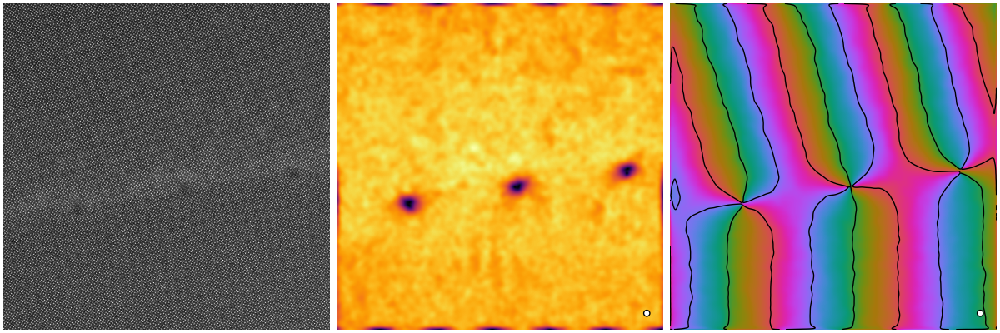

In [22]:
phase = kemstem.phaselock(filtered_im,peaks_ref[peak_index,:],sigma=40) # different from the sigma above 
# this sigma is a parameter of the lock in analysis and should generally be larger than the sigma used for Fourier filtering
# but should not need to be changed here

fig,ax = plt.subplots(1,3,constrained_layout=True,figsize=(12,4))

ax[0].matshow(image,cmap='gray')
ax[0].axis('off')
ax[1].matshow(np.abs(filtered_im),cmap='inferno')
ax[1].axis('off')
kemstem.util.plot_phase(phase,ax=ax[2])
ax[2].axis('off')

kemstem.coarsening_marker(ax[1],kemstem.coarsening_length(image.shape[0],sigma),edgecolor='k',facecolor='w')
kemstem.coarsening_marker(ax[2],kemstem.coarsening_length(image.shape[0],sigma),edgecolor='k',facecolor='w',zorder=2)

Strain can be mapped by calculating the phase gradient and looking at its variation along the lattice vector of interest (and normalized to the length of this vector). Artifacts can occur due to wrapping of the phase, adjusting the `mask_threshold` argument may help mitigate them. `sv` is a visualization parameter setting the saturation point of the strain map.

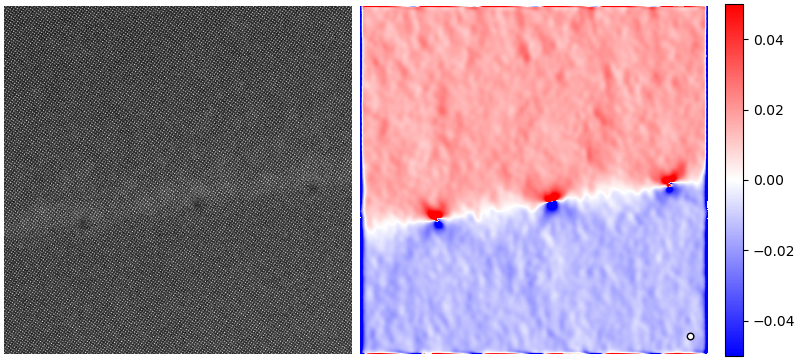

In [74]:
# strain
sv = .05

ref_x = peaks_ref[peak_index,1]-image.shape[0]/2. 
ref_y = peaks_ref[peak_index,0]-image.shape[0]/2. 
eps_par, eps_trans = kemstem.fourier.phase_to_strain(phase, ref_x, ref_y, mask_threshold=0.5)
fig,ax = plt.subplots(1,2,constrained_layout=True,figsize=(8,3.6),sharex=True,sharey=True)
ax[0].matshow(image,cmap='gray')
ax[0].axis('off')
pl_strain_map = ax[1].matshow(eps_par,cmap='bwr',vmin=-sv,vmax=sv)
ax[1].axis('off')
kemstem.coarsening_marker(ax[1],kemstem.coarsening_length(image.shape[0],sigma))
fig.colorbar(pl_strain_map,ax=ax[1])


# Strain measurement with local wave fitting

## Fitting dataset

Alternatively, lattice parameters and strain can be measured with local wave fitting as described in [Smeaton,et al. (2021)](https://doi.org/10.1021/acsnano.0c06990).

Wave-fitting quantifies changes in lattice parameters by fitting small patches of the real part of the real part of the Fourier filtered signal (or 'grating') from a peak of interest with sine waves. The frequency of the fit waves is inversely related to the local lattice parameter, allowing variations to be identified from the fit parameters.

Two critical parameters in this process are the `patch_size`, which sets the size of each local patch of the grating to be fit and should include just a couple wavelengths of the wave, and the `patch_step`, which sets the distance between adjacent patches and consequently the sampling of the resulting maps.

The `patch_size` parameter can be chosen with the below test function which shows a fit to a single patch - the patch and fit should match in periodicity and orientation, and the patch should include only a small number (but at least one) sinusoidal period.

161604 total patches, testing on 40401


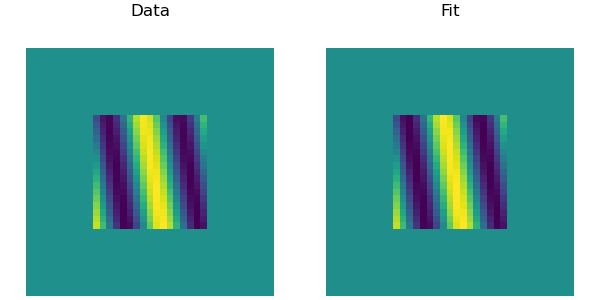

In [25]:
patch_size = 17
patch_step = 5

grating = np.real(filtered_im)
grating = grating / grating.max()
guess = kemstem.fourier.wavefit.peak_to_fit_guess(peaks_ref[peak_index,:],np.array(grating.shape))
popt,perr,data_fits = kemstem.fourier.wavefit.test_fit(grating,patch_size,patch_step,guess,test_patch_idx = None)
_ = kemstem.util.viz.plot_fit_comparison(data_fits,figsize=(6,3))


Next, we can repeat this process on patches sampled from across the entire grating to measure the local lattice parameter variations across the full image. This process is parallelized with multiprocessing - the number of fits allotted to each process can be controlled with chunksize, or left as None to split the work across 20 chunks

In [27]:
amplitude,spacing,rotation,sampled_points = kemstem.fit_grating(grating,patch_size,patch_step,guess,
                                                chunksize=None, # default: total number of patches/20
                                                match_image_shape=True # interpolates results to match original image dimensions
                                                )

# of patches: 161604
Using chunk size: 8080


## Calculating relevant coarsening lengths
The real space coarsening length associated with this processing can be set by a number of different processing parameters. To determine which is limiting, lengths associated with each choice are compared:

In [52]:
coarsening_filtering = kemstem.coarsening_length(image.shape[0],sigma)
print(f'Coarsening length of initial Fourier filtering: {np.round(coarsening_filtering,2)} px')
print(f'Size of fit patches: {np.round(patch_size,2)} px')
print(f'Size of step between patches: {np.round(patch_step,2)} px')

# Typically, either the fourier filtering or size of fit patches will be limiting
# here, we take the larger of these as the coarsening associated with the measurement.
wf_coarsening = max(coarsening_filtering,patch_size,patch_step)

Coarsening length of initial Fourier filtering: 18.97 px
Size of fit patches: 17 px
Size of step between patches: 5 px


## Visualizing interplanar spacings and angles

The local amplitude, spacing, and rotation are returned for each patch fit, as well as the positions of the patches (`sampled_points`). The spacing (in nm) and rotation (in radians) are plotted below. showing relaxation of the thin film associated with the misfit dislocations present at the film-substrate interface.

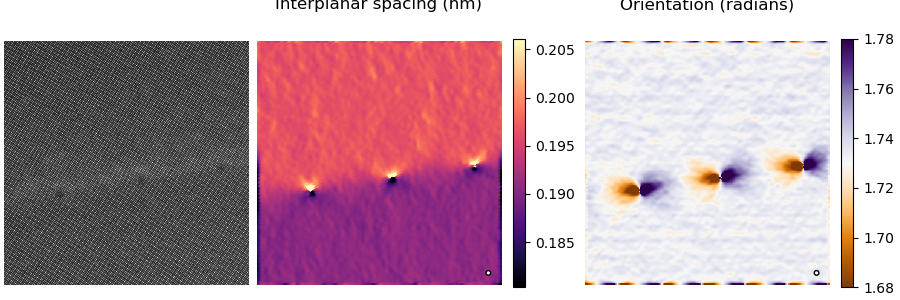

In [69]:
nm_per_px = 0.0184 # image pixel size - can extract from image metadata or calculate from known structure

fig,ax = plt.subplots(1,3,constrained_layout=True,figsize=(9,3.))
ax[0].matshow(image,cmap='gray')
ax[0].axis('off')
spacing_map = ax[1].matshow(spacing*nm_per_px,vmin=(10.5-.7)*nm_per_px,vmax=(10.5+.7)*nm_per_px,cmap='magma')
kemstem.coarsening_marker(ax[1],wf_coarsening)
ax[1].axis('off')
rotation_map = ax[2].matshow(rotation,vmin=1.73-.05,vmax=1.73+.05,cmap='PuOr')
kemstem.coarsening_marker(ax[2],wf_coarsening)
ax[2].axis('off')
ax[1].set_title('Interplanar spacing (nm)')
ax[2].set_title('Orientation (radians)')

fig.colorbar(spacing_map,ax=ax[1])
fig.colorbar(rotation_map,ax=ax[2])

A histogram of the spacing shows the distribution of interplanar distances in the substrate and film

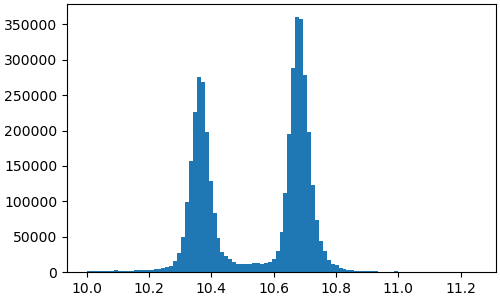

In [55]:
fig,ax = plt.subplots(1,1,figsize=(5,3),constrained_layout=True)
_ = ax.hist(spacing.ravel(),bins=np.linspace(10,11.25,100))

The lattice parameter measurement can be converted to a strain by calculating its deviation from a reference value. Below, the strain relative to:

(1) the mean spacing of the image - yielding a result similar to the phase lock in analysis

(2) the average substrate spacing - highlighting the relaxation of the substrate

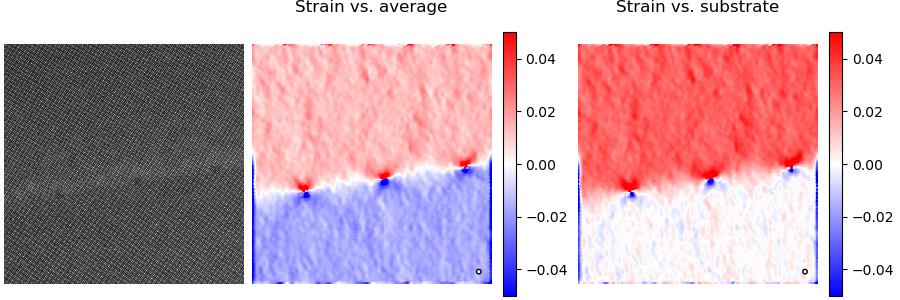

In [78]:
substrate_hist_peak = 10.36 # read off the above histogram

strain_wrt_mean = (spacing - np.mean(spacing))/ np.mean(spacing)
strain_wrt_subs = (spacing - substrate_hist_peak)/ substrate_hist_peak


fig,ax = plt.subplots(1,3,constrained_layout=True,figsize=(9,3.))
ax[0].matshow(image,cmap='gray')
ax[0].axis('off')
wf_strain_mean_map = ax[1].matshow(strain_wrt_mean,cmap='bwr',vmin=-sv,vmax=sv)
kemstem.coarsening_marker(ax[1],wf_coarsening)
ax[1].axis('off')
wf_strain_subs_map = ax[2].matshow(strain_wrt_subs,cmap='bwr',vmin=-sv,vmax=sv)
kemstem.coarsening_marker(ax[2],wf_coarsening)
ax[2].axis('off')

ax[1].set_title('Strain vs. average')
ax[2].set_title('Strain vs. substrate')
fig.colorbar(wf_strain_mean_map,ax=ax[1])
fig.colorbar(wf_strain_subs_map,ax=ax[2])
